### Download the Data

In [3]:
import os
import tarfile
from six.moves import urllib

# single compressed file, housing.tgz, which contains a
# comma-separated value (CSV) file called housing.csv with all the data.

DOWNLOAD_ROOT = "https://raw.githubusercontent.com/ageron/handson-ml/master/"
HOUSING_PATH = "datasets/housing"
HOUSING_URL = DOWNLOAD_ROOT + HOUSING_PATH + "/housing.tgz"

In [4]:
def fetch_housing_data(housing_url=HOUSING_URL, housing_path=HOUSING_PATH):
    if not os.path.isdir(housing_path):
        os.makedirs(housing_path)
    tgz_path = os.path.join(housing_path, "housing.tgz")
    urllib.request.urlretrieve(housing_url, tgz_path)
    housing_tgz = tarfile.open(tgz_path)
    housing_tgz.extractall(path=housing_path)
    housing_tgz.close()
    
fetch_housing_data()

In [5]:
# load the data using Pandas
import pandas as pd
def load_housing_data(housing_path=HOUSING_PATH):
    csv_path = os.path.join(housing_path, "housing.csv")
    return pd.read_csv(csv_path)

### Load Data

In [6]:
housing = load_housing_data()
housing.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [7]:
# get a quick description of the data
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [8]:
# unique values of the categorical variable
housing['ocean_proximity'].value_counts()

<1H OCEAN     9136
INLAND        6551
NEAR OCEAN    2658
NEAR BAY      2290
ISLAND           5
Name: ocean_proximity, dtype: int64

In [9]:
# summary of the numerical attributes
housing.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


25% of the districts have a housing_median_age lower than 18, while 50% are lower than 29 and 75% are lower than 37. 

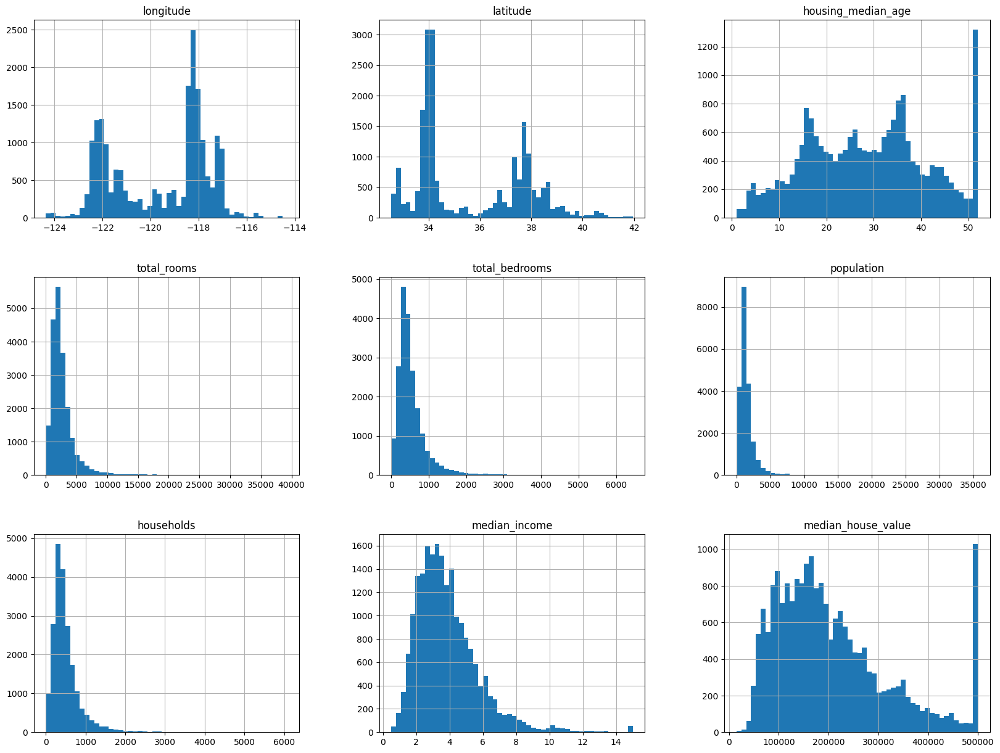

In [10]:
# only in a Jupyter notebook
%matplotlib inline 
import matplotlib.pyplot as plt
housing.hist(bins=50, figsize=(20,15))
plt.show()

Notice a few things in these histograms:
1. First, the median income attribute does not look like it is expressed in US dollars (USD). After checking with the team that collected the data, we are told that the data has been scaled and capped at 15 (actually 15.0001) for higher median incomes, and at 0.5 (actually 0.4999) for lower median incomes. Working with preprocessed attributes is common in Machine Learning, and it is not necessarily a problem, but we should try to understand how the data was computed.
2. The housing median age and the median house value were also capped. The latter may be a serious problem since it is our target attribute (our labels). Our Machine Learning algorithms may learn that prices never go beyond that limit. We need to check with our client team (the team that will use our system’s out‐put) to see if this is a problem or not. If they tell us that they need precise predictions even beyond $\$500,000$, then we have mainly two options:  
a. Collect proper labels for the districts whose labels were capped.  
b. Remove those districts from the training set (and also from the test set, since our system should not be evaluated poorly if it predicts values beyond $500,000).
3. These attributes have very different scales. We have to do feature-scaling.
4. Finally, many histograms are tail heavy: they extend much farther to the right of the median than to the left. This may make it a bit harder for some Machine Learning algorithms to detect patterns. We will try transforming these attributes later on to have more bell-shaped distributions.

### Create a Test Set

It may sound strange to voluntarily set aside part of the data at this stage. After all,
we have only taken a quick glance at the data, and surely we should learn a whole
lot more about it before we decide what algorithms to use, right? This is true, but
our brain is an amazing pattern detection system, which means that it is highly
prone to overfitting: if we look at the test set, we may stumble upon some seemingly
interesting pattern in the test data that leads us to select a particular kind of
Machine Learning model. When we estimate the generalization error using the test
set, our estimate will be too optimistic and we will launch a system that will not
perform as well as expected. This is called data snooping bias.  
Creating a test set is theoretically quite simple: just pick some instances randomly,
typically 20% of the dataset, and set them aside:

In [11]:
import numpy as np
def split_train_test(data, test_ratio):
    shuffled_indices = np.random.permutation(len(data))
    test_set_size = int(len(data) * test_ratio)
    test_indices = shuffled_indices[:test_set_size]
    train_indices = shuffled_indices[test_set_size:]
    return data.iloc[train_indices], data.iloc[test_indices]

In [12]:
train_set, test_set = split_train_test(housing, 0.2)
print(len(train_set), "train +", len(test_set), "test")

16512 train + 4128 test


Well, this works, but it is not perfect: if we run the program again, it will generate a
different test set! Over time, we (or our Machine Learning algorithms) will get to
see the whole dataset, which is what we want to avoid.  
One solution is to save the test set on the first run and then load it in subsequent
runs. Another option is to set the random number generator’s seed (e.g., np.ran
dom.seed(42))13 before calling np.random.permutation(), so that it always generates
the same shuffled indices.  
But both these solutions will break next time we fetch an updated dataset. A com‐
mon solution is to use each instance’s identifier to decide whether or not it should go
in the test set (assuming instances have a unique and immutable identifier). For
example, we could compute a hash of each instance’s identifier, keep only the last
byte of the hash, and put the instance in the test set if this value is lower or equal to
51 (~20% of 256). This ensures that the test set will remain consistent across multiple
runs, even if we refresh the dataset. The new test set will contain 20% of the new
instances, but it will not contain any instance that was previously in the training set.
Here is a possible implementation:

In [13]:
import hashlib
def test_set_check(identifier, test_ratio, hash):
    return hash(np.int64(identifier)).digest()[-1] < 256 * test_ratio
def split_train_test_by_id(data, test_ratio, id_column, hash=hashlib.md5):
    ids = data[id_column]
    in_test_set = ids.apply(lambda id_: test_set_check(id_, test_ratio, hash))
    return data.loc[~in_test_set], data.loc[in_test_set]

`hash=hashlib.md5`  
This statement initializes the hash variable with the md5 hash function from the hashlib module.  
MD5 is a cryptographic hash function that takes an input (in this case, an identifier) and generates a fixed-size output called a hash value. The hash value is typically a hexadecimal string representation of the input data.

In [14]:
hash=hashlib.md5
hash(np.int64(70))

<md5 HASH object @ 0x0000028373609C30>

The hash function takes an input data and produces a fixed-length output called a digest or hash value. The `digest()` method returns this hash value as a bytes object, which can be used to uniquely identify the input data.

In [15]:
hash(np.int64(70)).digest()

b'=\xc4\xba`\x8d\x04Ak\x96\xf2\xc4\xb3/ \xb8\x0e'

`[-1]` is an index to access the last element (i.e., the last byte) of the bytes object.

In [16]:
hash(np.int64(70)).digest()[-1]

14

Check the instance whether the value is lower or equal to 51 (~20% of 256)

In [17]:
test_ratio = 0.2
hash(np.int64(70)).digest()[-1] < 256 * test_ratio

True

Unfortunately, the housing dataset does not have an identifier column. The simplest solution is to use the row index as the ID:

In [18]:
housing_with_id = housing.reset_index() # adds an `index` column
train_set, test_set = split_train_test_by_id(housing_with_id, 0.2, "index")

If we use the row index as a unique identifier, we need to make sure that new data
gets appended to the end of the dataset, and no row ever gets deleted. If this is not
possible, then we can try to use the most stable features to build a unique identifier.
For example, a district’s latitude and longitude are guaranteed to be stable for a few
million years, so we could combine them into an ID like so:

In [19]:
housing_with_id["id"] = housing["longitude"] * 1000 + housing["latitude"]
train_set, test_set = split_train_test_by_id(housing_with_id, 0.2, "id")

Scikit-Learn provides a few functions to split datasets into multiple subsets in various
ways. The simplest function is train_test_split, which does pretty much the same
thing as the function split_train_test defined earlier, with a couple of additional
features. First there is a random_state parameter that allows us to set the random
generator seed as explained previously, and second we can pass it multiple datasets
with an identical number of rows, and it will split them on the same indices (this is
very useful, for example, if we have a separate DataFrame for labels):

In [20]:
from sklearn.model_selection import train_test_split
train_set, test_set = train_test_split(housing, test_size=0.2, random_state=42)

So far we have considered purely random sampling methods. This is generally fine if
our dataset is large enough (especially relative to the number of attributes), but if it
is not, we run the risk of introducing a significant sampling bias.

The following code creates an income category
attribute by dividing the median income by 1.5 (to limit the number of income cate‐
gories), and rounding up using ceil (to have discrete categories), and then merging
all the categories greater than 5 into category 5:

In [21]:
housing["income_cat"] = np.ceil(housing["median_income"] / 1.5)
housing["income_cat"].where(housing["income_cat"] < 5, 5.0, inplace=True)

Now we are ready to do stratified sampling based on the income category. For this
we can use Scikit-Learn’s StratifiedShuffleSplit class:

In [22]:
from sklearn.model_selection import StratifiedShuffleSplit
split = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
for train_index, test_index in split.split(housing, housing["income_cat"]):
    strat_train_set = housing.loc[train_index]
    strat_test_set = housing.loc[test_index]

Let’s see if this worked as expected. We can start by looking at the income category
proportions in the full housing dataset:

In [23]:
housing["income_cat"].value_counts() / len(housing)

3.0    0.350581
2.0    0.318847
4.0    0.176308
5.0    0.114438
1.0    0.039826
Name: income_cat, dtype: float64

Now we should remove the income_cat attribute so the data is back to its original
state:

In [24]:
for set in (strat_train_set, strat_test_set):
    set.drop(["income_cat"], axis=1, inplace=True)

We spent quite a bit of time on test set generation for a good reason: this is an often
neglected but critical part of a Machine Learning project. Moreover, many of these
ideas will be useful later when we discuss cross-validation.

### Exploratory Data Analysis

First, make sure we have put the test set aside and we are only exploring the train‐
ing set. Also, if the training set is very large, we may want to sample an exploration
set, to make manipulations easy and fast. In our case, the set is quite small so we can
just work directly on the full set. Let’s create a copy so we can play with it without
harming the training set:

In [25]:
housing = strat_train_set.copy()

#### Visualizing Geographical Data

<Axes: xlabel='longitude', ylabel='latitude'>

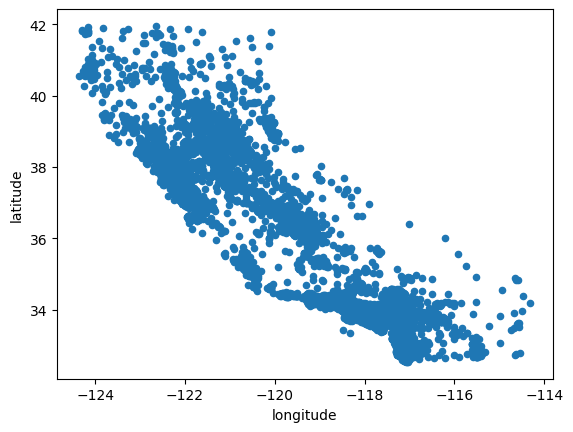

In [26]:
housing.plot(kind="scatter", x="longitude", y="latitude")

This looks like California all right, but other than that it is hard to see any particular
pattern. Setting the alpha option to 0.1 makes it much easier to visualize the places
where there is a high density of data points

<Axes: xlabel='longitude', ylabel='latitude'>

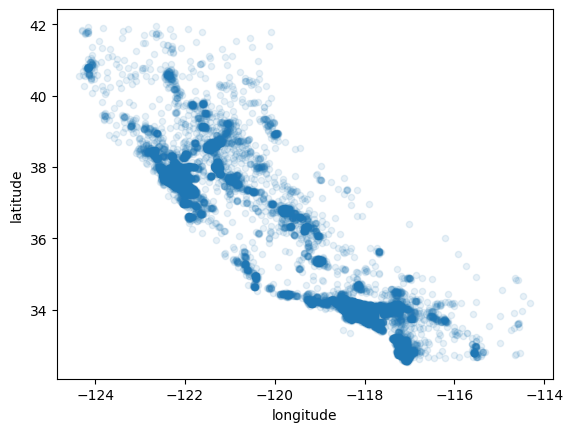

In [27]:
housing.plot(kind="scatter", x="longitude", y="latitude", alpha=0.1)

Now that’s much better: if we look at the map below and compare with the above one, we can clearly see the high-density areas, namely the Bay
Area and around Los Angeles and San Diego, plus a long line of fairly high density in
the Central Valley, in particular around Sacramento and Fresno.

In [28]:
import folium
# from folium import plugins
# from folium.plugins import MarkerCluster

# Create a map centered on California
map_ca = folium.Map(location=[36.7783, -119.4179], tiles="OpenStreetMap", zoom_start=5)

# Convert the housing data to a list of lat-long coordinates
# heat_data = housing[['latitude', 'longitude']].values.tolist()

# Add the heatmap layer to the map
# plugins.HeatMap(heat_data).add_to(map_ca)

# Create a MarkerCluster object from the housing data
# marker_cluster = MarkerCluster()
# for index, row in housing.iterrows():
#     folium.Marker(location=[row["latitude"], row["longitude"]], popup=row["median_house_value"]).add_to(marker_cluster)
# marker_cluster.add_to(map_ca)

# Create a FeatureGroup object for the housing data
housing_fg = folium.FeatureGroup(name="Housing Data")
for index, row in housing.iterrows():
    folium.Marker(location=[row["latitude"], row["longitude"]], popup=row["median_house_value"]).add_to(housing_fg)
housing_fg.add_to(map_ca)

# Add a layer control to the map
folium.LayerControl().add_to(map_ca)

# Display the map
map_ca


<img src="images/map_of_california.jpg" alt="Image" width="500" height="500">

Now let’s look at the housing prices.  
- The radius of each circle represents the district’s population (option s),  
- The color represents the price (option c).  
We will use a predefined color map (option cmap) called jet, which ranges from blue (low values) to red (high prices):

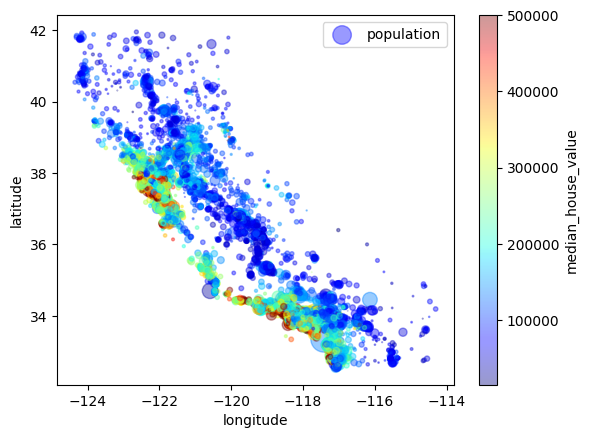

In [29]:
housing.plot(kind="scatter", x="longitude", y="latitude", alpha=0.4,
    s=housing["population"]/100, label="population",
    c="median_house_value", cmap=plt.get_cmap("jet"), colorbar=True,
)
plt.legend()

This image tells us that the housing prices are very much related to the location
(e.g., close to the ocean) and to the population density, as we probably knew already.
It will probably be useful to use a clustering algorithm to detect the main clusters, and
add new features that measure the proximity to the cluster centers. The ocean prox‐
imity attribute may be useful as well, although in Northern California the housing
prices in coastal districts are not too high, so it is not a simple rule.

#### Correlations

Since the dataset has only 10 numeric features, we can easily compute the standard correlation
coefficient (also called Pearson’s r) between every pair of attributes using the corr()
method:

In [30]:
corr_matrix = housing.corr()

C:\Users\avish\AppData\Local\Temp\ipykernel_15176\2466220658.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = housing.corr()


Now let’s look at how much each attribute correlates with the median house value:

In [31]:
corr_matrix["median_house_value"].sort_values(ascending=False)

median_house_value    1.000000
median_income         0.687151
total_rooms           0.135140
housing_median_age    0.114146
households            0.064590
total_bedrooms        0.047781
population           -0.026882
longitude            -0.047466
latitude             -0.142673
Name: median_house_value, dtype: float64

The correlation coefficient ranges from –1 to 1. When it is close to 1, it means that
there is a strong positive correlation; for example, the median house value tends to go
up when the median income goes up. When the coefficient is close to –1, it means
that there is a strong negative correlation; we can see a small negative correlation
between the latitude and the median house value (i.e., prices have a slight tendency to
go down when we go north). Finally, coefficients close to zero mean that there is no
linear correlation.  

Note: The correlation coefficient only measures linear correlations (“if x
goes up, then y generally goes up/down”). It may completely miss
out on nonlinear relationships (e.g., “if x is close to zero then y gen‐
erally goes up”). 

Another way to check for correlation between attributes is to use Pandas’
scatter_matrix function, which plots every numerical attribute against every other
numerical attribute. Since there are now 10 numerical attributes, we would get $10^2 = 100$ plots, which would not fit on a page, so let’s just focus on a few promising
attributes that seem most correlated with the median housing value

array([[<Axes: xlabel='median_house_value', ylabel='median_house_value'>,
        <Axes: xlabel='median_income', ylabel='median_house_value'>,
        <Axes: xlabel='total_rooms', ylabel='median_house_value'>,
        <Axes: xlabel='housing_median_age', ylabel='median_house_value'>],
       [<Axes: xlabel='median_house_value', ylabel='median_income'>,
        <Axes: xlabel='median_income', ylabel='median_income'>,
        <Axes: xlabel='total_rooms', ylabel='median_income'>,
        <Axes: xlabel='housing_median_age', ylabel='median_income'>],
       [<Axes: xlabel='median_house_value', ylabel='total_rooms'>,
        <Axes: xlabel='median_income', ylabel='total_rooms'>,
        <Axes: xlabel='total_rooms', ylabel='total_rooms'>,
        <Axes: xlabel='housing_median_age', ylabel='total_rooms'>],
       [<Axes: xlabel='median_house_value', ylabel='housing_median_age'>,
        <Axes: xlabel='median_income', ylabel='housing_median_age'>,
        <Axes: xlabel='total_rooms', ylabel='housi

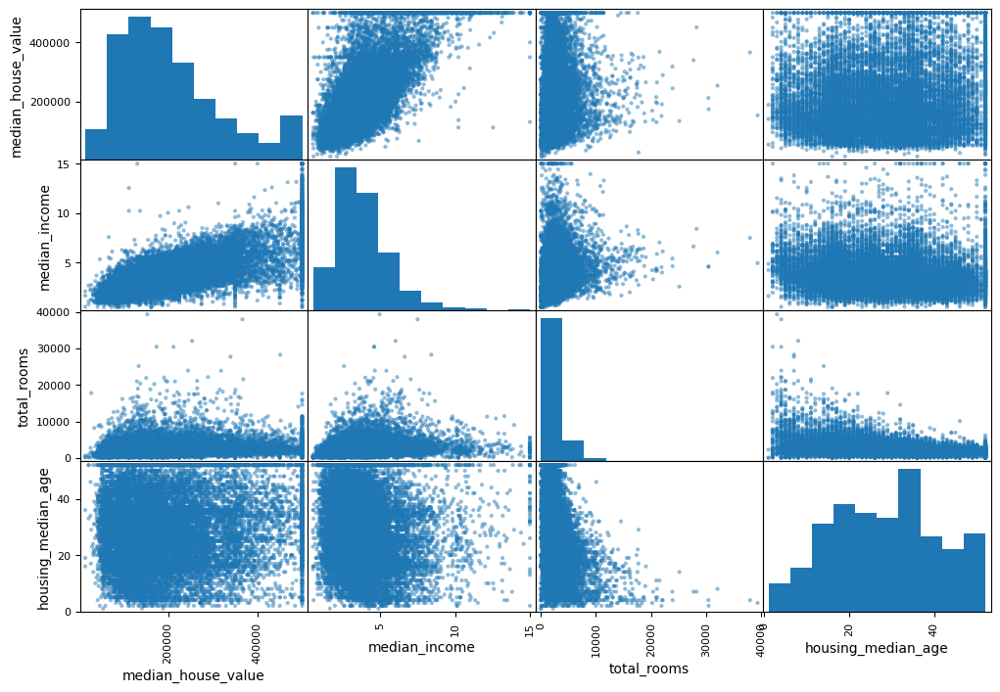

In [32]:
from pandas.plotting import scatter_matrix
attributes = ["median_house_value", "median_income", "total_rooms",
                "housing_median_age"]
scatter_matrix(housing[attributes], figsize=(12, 8))

The most promising attribute to predict the median house value is the median
income, so let’s zoom in on their correlation scatterplot

<Axes: xlabel='median_income', ylabel='median_house_value'>

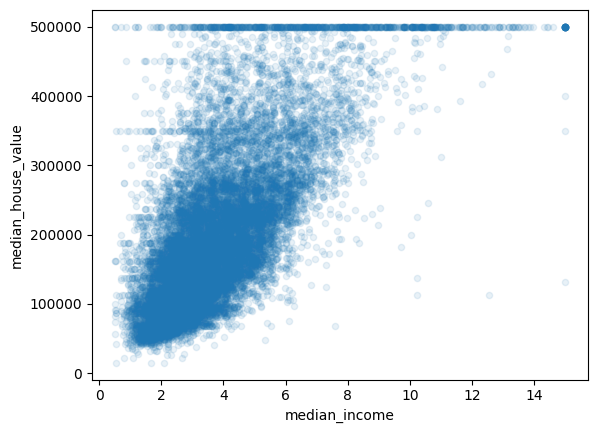

In [33]:
housing.plot(kind="scatter", x="median_income", y="median_house_value", alpha=0.1)

This plot reveals a few things. First, the correlation is indeed very strong; we can
clearly see the upward trend and the points are not too dispersed. Second, the price
cap that we noticed earlier is clearly visible as a horizontal line at $500,000. But this
plot reveals other less obvious straight lines: a horizontal line around $450,000,
another around $350,000, perhaps one around $280,000, and a few more below that.
We may want to try removing the corresponding districts to prevent our algorithms
from learning to reproduce these data quirks.

#### Experimenting with Attribute Combinations

One last thing we may want to do before actually preparing the data for Machine
Learning algorithms is to try out various attribute combinations. For example, the
total number of rooms in a district is not very useful if we don’t know how many
households there are. What we really want is the number of rooms per household.
Similarly, the total number of bedrooms by itself is not very useful: we probably
want to compare it to the number of rooms. And the population per household also seems like an interesting attribute combination to look at. Let’s create these new
attributes:

In [34]:
housing["rooms_per_household"] = housing["total_rooms"]/housing["households"]
housing["bedrooms_per_room"] = housing["total_bedrooms"]/housing["total_rooms"]
housing["population_per_household"]=housing["population"]/housing["households"]

And now let’s look at the correlation matrix again:

In [35]:
corr_matrix = housing.corr()
corr_matrix["median_house_value"].sort_values(ascending=False)

C:\Users\avish\AppData\Local\Temp\ipykernel_15176\826279322.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = housing.corr()


median_house_value          1.000000
median_income               0.687151
rooms_per_household         0.146255
total_rooms                 0.135140
housing_median_age          0.114146
households                  0.064590
total_bedrooms              0.047781
population_per_household   -0.021991
population                 -0.026882
longitude                  -0.047466
latitude                   -0.142673
bedrooms_per_room          -0.259952
Name: median_house_value, dtype: float64

The new `bedrooms_per_room` attribute is much more correlated with
the median house value than the total number of rooms or bedrooms. Apparently
houses with a lower bedroom/room ratio tend to be more expensive. The number of
rooms per household is also more informative than the total number of rooms in a
district—obviously the larger the houses, the more expensive they are.

This round of exploration does not have to be absolutely thorough; the point is to
start off on the right foot and quickly gain insights that will help you get a first reasonably good prototype. But this is an iterative process: once you get a prototype up
and running, you can analyze its output to gain more insights and come back to this
exploration step.

### Prepare the Data for Machine Learning Algorithms

Let’s revert to a clean training set (by copying strat_train_set once again),
and let’s separate the predictors and the labels since we don’t necessarily want to apply
the same transformations to the predictors and the target values (note that drop()
creates a copy of the data and does not affect strat_train_set):

In [36]:
housing = strat_train_set.drop("median_house_value", axis=1)
housing_labels = strat_train_set["median_house_value"].copy()

#### Data Cleaning

Most Machine Learning algorithms cannot work with missing features, so let’s create
a few functions to take care of them. We noticed earlier that the total_bedrooms
attribute has some missing values, so let’s fix this. We have three options:  
• Get rid of the corresponding districts.  
• Get rid of the whole attribute.  
• Set the values to some value (zero, the mean, the median, etc.).  
We can accomplish these easily using DataFrame’s dropna(), drop(), and fillna()
methods:  
```python
housing.dropna(subset=["total_bedrooms"]) # option 1
housing.drop("total_bedrooms", axis=1) # option 2
median = housing["total_bedrooms"].median()
housing["total_bedrooms"].fillna(median) # option 3
```
If we choose option 3, you should compute the median value on the training set, and
use it to fill the missing values in the training set, but also we have to save the
median value that we have computed. We will need it later to replace missing values
in the test set when we want to evaluate your system, and also once the system goes
live to replace missing values in new data.
Scikit-Learn provides a handy class to take care of missing values: Imputer. Here is
how to use it. First, we need to create an Imputer instance, specifying that we want
to replace each attribute’s missing values with the median of that attribute:

In [37]:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy="median")

Since the median can only be computed on numerical attributes, we need to create a
copy of the data without the text attribute ocean_proximity:

In [38]:
housing_num = housing.drop("ocean_proximity", axis=1)

Now we can fit the imputer instance to the training data using the fit() method:

In [39]:
imputer.fit(housing_num)

SimpleImputer(strategy='median')

The imputer has simply computed the median of each attribute and stored the result
in its statistics_ instance variable. Only the total_bedrooms attribute had missing
values, but we cannot be sure that there won’t be any missing values in new data after
the system goes live, so it is safer to apply the imputer to all the numerical attributes:

In [40]:
imputer.statistics_

array([-118.51   ,   34.26   ,   29.     , 2119.     ,  433.     ,
       1164.     ,  408.     ,    3.54155])

In [41]:
housing_num.median().values

array([-118.51   ,   34.26   ,   29.     , 2119.     ,  433.     ,
       1164.     ,  408.     ,    3.54155])

Now we can use this “trained” imputer to transform the training set by replacing
missing values by the learned medians:

In [42]:
X = imputer.transform(housing_num)

The result is a plain Numpy array containing the transformed features. If we want to
put it back into a Pandas DataFrame, it’s simple:

In [43]:
housing_tr = pd.DataFrame(X, columns=housing_num.columns)

#### Handling Text and Categorical Attributes

Earlier we left out the categorical attribute ocean_proximity because it is a text
attribute so we cannot compute its median. Most Machine Learning algorithms pre‐
fer to work with numbers anyway, so let’s convert these text labels to numbers.
Scikit-Learn provides a transformer for this task called LabelEncoder:

In [44]:
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()
housing_cat = housing["ocean_proximity"]
housing_cat_encoded = encoder.fit_transform(housing_cat)
housing_cat_encoded

array([1, 4, 1, ..., 0, 0, 1])

This is better: now we can use this numerical data in any ML algorithm. We can look
at the mapping that this encoder has learned using the classes_ attribute (“<1H
OCEAN” is mapped to 0, “INLAND” is mapped to 1, etc.):

In [45]:
print(encoder.classes_)

['<1H OCEAN' 'INLAND' 'ISLAND' 'NEAR BAY' 'NEAR OCEAN']


One issue with this representation is that ML algorithms will assume that two nearby
values are more similar than two distant values. Obviously this is not the case (for
example, categories 0 and 4 are more similar than categories 0 and 1). To fix this
issue, a common solution is to create one binary attribute per category: one attribute
equal to 1 when the category is “<1H OCEAN” (and 0 otherwise), another attribute
equal to 1 when the category is “INLAND” (and 0 otherwise), and so on. This is
called one-hot encoding, because only one attribute will be equal to 1 (hot), while the
others will be 0 (cold).

Scikit-Learn provides a OneHotEncoder encoder to convert integer categorical values
into one-hot vectors. Let’s encode the categories as one-hot vectors. Note that
fit_transform() expects a 2D array, but housing_cat_encoded is a 1D array, so we
need to reshape it:

In [46]:
from sklearn.preprocessing import OneHotEncoder
encoder = OneHotEncoder()
housing_cat_1hot = encoder.fit_transform(housing_cat_encoded.reshape(-1,1))
housing_cat_1hot

<16512x5 sparse matrix of type '<class 'numpy.float64'>'
	with 16512 stored elements in Compressed Sparse Row format>

Notice that the output is a SciPy sparse matrix, instead of a NumPy array. This is very
useful when we have categorical attributes with thousands of categories. After onehot encoding we get a matrix with thousands of columns, and the matrix is full of
zeros except for one 1 per row. Using up tons of memory mostly to store zeros would
be very wasteful, so instead a sparse matrix only stores the location of the nonzero
elements. We can use it mostly like a normal 2D array,19 but if you really want to con‐
vert it to a (dense) NumPy array, just call the toarray() method:

In [47]:
housing_cat_1hot.toarray()

array([[0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 1.],
       [0., 1., 0., 0., 0.],
       ...,
       [1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0.]])

We can apply both transformations (from text categories to integer categories, then
from integer categories to one-hot vectors) in one shot using the LabelBinarizer
class:

In [48]:
from sklearn.preprocessing import LabelBinarizer
encoder = LabelBinarizer()
housing_cat_1hot = encoder.fit_transform(housing_cat)
housing_cat_1hot

array([[0, 1, 0, 0, 0],
       [0, 0, 0, 0, 1],
       [0, 1, 0, 0, 0],
       ...,
       [1, 0, 0, 0, 0],
       [1, 0, 0, 0, 0],
       [0, 1, 0, 0, 0]])

Note that this returns a dense NumPy array by default. We can get a sparse matrix
instead by passing sparse_output=True to the LabelBinarizer constructor.

#### Custom Transformers

Although Scikit-Learn provides many useful transformers, we will need to write
our own for tasks such as custom cleanup operations or combining specific
attributes. We will want our transformer to work seamlessly with Scikit-Learn func‐
tionalities (such as pipelines), and since Scikit-Learn relies on duck typing (not inher‐
itance), all we need is to create a class and implement three methods: fit()
(returning self), transform(), and fit_transform(). We can get the last one for
free by simply adding TransformerMixin as a base class. Also, if we add BaseEstimator as a base class (and avoid *args and **kargs in your constructor) we will get
two extra methods (get_params() and set_params()) that will be useful for auto‐
matic hyperparameter tuning. For example, here is a small transformer class that adds
the combined attributes we discussed earlier:

In [49]:
from sklearn.base import BaseEstimator, TransformerMixin

# column index
rooms_ix, bedrooms_ix, population_ix, household_ix = 3, 4, 5, 6

class CombinedAttributesAdder(BaseEstimator, TransformerMixin):
    def __init__(self, add_bedrooms_per_room = True): # no *args or **kargs
        self.add_bedrooms_per_room = add_bedrooms_per_room
    def fit(self, X, y=None):
        return self # nothing else to do
    def transform(self, X, y=None):
        # X is a numpy array containing all the data
        rooms_per_household = X[:, rooms_ix] / X[:, household_ix]
        population_per_household = X[:, population_ix] / X[:, household_ix]
        if self.add_bedrooms_per_room:
            bedrooms_per_room = X[:, bedrooms_ix] / X[:, rooms_ix]
            # np.c_ is the numpy concatenate function
            return np.c_[X, rooms_per_household, population_per_household,
bedrooms_per_room]
        else:
            return np.c_[X, rooms_per_household, population_per_household]
        
attr_adder = CombinedAttributesAdder(add_bedrooms_per_room=False)
housing_extra_attribs = attr_adder.transform(housing.values)

In this example the transformer has one hyperparameter, add_bedrooms_per_room,
set to True by default (it is often helpful to provide sensible defaults). This hyperpara‐
meter will allow us to easily find out whether adding this attribute helps the
Machine Learning algorithms or not. More generally, we can add a hyperparameter
to gate any data preparation step that we are not 100% sure about. The more we
automate these data preparation steps, the more combinations we can automatically
try out, making it much more likely that we will find a great combination (and sav‐
ing us a lot of time).

#### Feature Scaling

One of the most important transformations we need to apply to our data is feature
scaling. With few exceptions, Machine Learning algorithms don’t perform well when
the input numerical attributes have very different scales. This is the case for the hous‐
ing data: the total number of rooms ranges from about 6 to 39,320, while the median
incomes only range from 0 to 15. Note that scaling the target values is generally not
required.
There are two common ways to get all attributes to have the same scale: min-max
scaling and standardization.
Min-max scaling (many people call this normalization) is quite simple: values are
shifted and rescaled so that they end up ranging from 0 to 1. We do this by subtract‐
ing the min value and dividing by the max minus the min. Scikit-Learn provides a
transformer called MinMaxScaler for this. It has a feature_range hyperparameter
that lets you change the range if you don’t want 0–1 for some reason.
Standardization is quite different: first it subtracts the mean value (so standardized
values always have a zero mean), and then it divides by the variance so that the result‐
ing distribution has unit variance. Unlike min-max scaling, standardization does not
bound values to a specific range, which may be a problem for some algorithms (e.g.,
neural networks often expect an input value ranging from 0 to 1). However, standard‐
ization is much less affected by outliers. For example, suppose a district had a median
income equal to 100 (by mistake). Min-max scaling would then crush all the other
values from 0–15 down to 0–0.15, whereas standardization would not be much affec‐
ted. Scikit-Learn provides a transformer called StandardScaler for standardization.

As with all the transformations, it is important to fit the scalers to
the training data only, not to the full dataset (including the test set).

#### Transformation Pipelines

As we can see, there are many data transformation steps that need to be executed in
the right order. Fortunately, Scikit-Learn provides the Pipeline class to help with
such sequences of transformations. Here is a small pipeline for the numerical
attributes:

In [50]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

num_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy="median")),
    ('attribs_adder', CombinedAttributesAdder()),
    ('std_scaler', StandardScaler()),
])

housing_num_tr = num_pipeline.fit_transform(housing_num)

The Pipeline constructor takes a list of name/estimator pairs defining a sequence of
steps. All but the last estimator must be transformers (i.e., they must have a
fit_transform() method). The names can be anything you like.
When you call the pipeline’s fit() method, it calls fit_transform() sequentially on
all transformers, passing the output of each call as the parameter to the next call, until
it reaches the final estimator, for which it just calls the fit() method.
The pipeline exposes the same methods as the final estimator. In this example, the last
estimator is a StandardScaler, which is a transformer, so the pipeline has a trans
form() method that applies all the transforms to the data in sequence (it also has a
fit_transform method that we could have used instead of calling fit() and then
transform()).
We now have a pipeline for numerical values, and we also need to apply the LabelBinarizer on the categorical values: how can you join these transformations into a single pipeline? Scikit-Learn provides a FeatureUnion class for this. We give it a list of
transformers (which can be entire transformer pipelines), and when its transform()
method is called it runs each transformer’s transform() method in parallel, waits for
their output, and then concatenates them and returns the result (and of course calling
its fit() method calls all each transformer’s fit() method).

Each subpipeline starts with a selector transformer: it simply transforms the data by
selecting the desired attributes (numerical or categorical), dropping the rest, and con‐
verting the resulting DataFrame to a NumPy array. There is nothing in Scikit-Learn
to handle Pandas DataFrames, so we need to write a simple custom transformer for
this task:

In [51]:
from sklearn.base import BaseEstimator, TransformerMixin

class DataFrameSelector(BaseEstimator, TransformerMixin):
    def __init__(self, attribute_names):
        self.attribute_names = attribute_names
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        return X[self.attribute_names].values

Before running the full pipeline we have to define our own LabelBinarizer class because the deafulat LabelBinarizer fit() and transform() takes 2 positional arguments takes 2 argument but here we will pass 3.

In [52]:
from sklearn.base import TransformerMixin 

class MyLabelBinarizer(TransformerMixin):
    def __init__(self, *args, **kwargs):
        self.encoder = LabelBinarizer(*args, **kwargs)
    def fit(self, x, y=0):
        self.encoder.fit(x)
        return self
    def transform(self, x, y=0):
        return self.encoder.transform(x)

A full pipeline handling
both numerical and categorical attributes may look like this:

In [53]:
from sklearn.pipeline import FeatureUnion

num_attribs = list(housing_num)
cat_attribs = ["ocean_proximity"]

num_pipeline = Pipeline([
    ('selector', DataFrameSelector(num_attribs)),
    ('imputer', SimpleImputer(strategy="median")),
    ('attribs_adder', CombinedAttributesAdder()),
    ('std_scaler', StandardScaler()),
])

cat_pipeline = Pipeline([
    ('selector', DataFrameSelector(cat_attribs)),
    ('label_binarizer', MyLabelBinarizer()),
])

full_pipeline = FeatureUnion(transformer_list=[
    ("num_pipeline", num_pipeline),
    ("cat_pipeline", cat_pipeline),
])

And we can run the whole pipeline simply:

In [54]:
housing_prepared = full_pipeline.fit_transform(housing)
housing_prepared

array([[-0.94135046,  1.34743822,  0.02756357, ...,  0.        ,
         0.        ,  0.        ],
       [ 1.17178212, -1.19243966, -1.72201763, ...,  0.        ,
         0.        ,  1.        ],
       [ 0.26758118, -0.1259716 ,  1.22045984, ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [-1.5707942 ,  1.31001828,  1.53856552, ...,  0.        ,
         0.        ,  0.        ],
       [-1.56080303,  1.2492109 , -1.1653327 , ...,  0.        ,
         0.        ,  0.        ],
       [-1.28105026,  2.02567448, -0.13148926, ...,  0.        ,
         0.        ,  0.        ]])

In [55]:
housing_prepared.shape

(16512, 16)

### Select and Train a Model

At last! We framed the problem, we got the data and explored it, we sampled a
training set and a test set, and we wrote transformation pipelines to clean up and
prepare our data for Machine Learning algorithms automatically. We are now ready
to select and train a Machine Learning model.

#### Training and Evaluating on the Training Set

The good news is that thanks to all these previous steps, things are now going to be
much simpler than we might think. Let’s first train a Linear Regression model:

In [56]:
from sklearn.linear_model import LinearRegression
lin_reg = LinearRegression()
lin_reg.fit(housing_prepared, housing_labels)

LinearRegression()

Now we have a working linear regression model. Let's try it out on a few instances from the training set:

In [57]:
some_data = housing.iloc[:5]
some_labels = housing_labels.iloc[:5]
some_data_prepared = full_pipeline.transform(some_data)
print("Predictions:\t", lin_reg.predict(some_data_prepared))
print("Labels:\t\t", list(some_labels))

Predictions:	 [ 85120. 305856. 152320. 186624. 244480.]
Labels:		 [72100.0, 279600.0, 82700.0, 112500.0, 238300.0]


It works, although the predictions are not exactly accurate (e.g., the third prediction
is off by more than 50%!). Let’s measure this regression model’s RMSE on the whole
training set using Scikit-Learn’s mean_squared_error function:

In [58]:
from sklearn.metrics import mean_squared_error
housing_predictions = lin_reg.predict(housing_prepared)
lin_mse = mean_squared_error(housing_labels, housing_predictions)
lin_rmse = np.sqrt(lin_mse)
lin_rmse

68634.20098818194

This is not a great score: most districts’
median_housing_values range between $120,000 and $265,000, so a typical predic‐
tion error of $68,628 is not very satisfying. This is an example of a model *underfitting*
the training data. When this happens it can mean that the features do not provide
enough information to make good predictions, or that the model is not powerful
enough. As we saw in the previous chapter, the main ways to fix *underfitting* are to select a more powerful model, to feed the training algorithm with better features, or
to reduce the constraints on the model. This model is not regularized, so this rules
out the last option. We could try to add more features (e.g., the log of the popula‐
tion), but first let’s try a more complex model to see how it does.
Let’s train a DecisionTreeRegressor. This is a powerful model, capable of finding
complex nonlinear relationships in the data.

In [59]:
from sklearn.tree import DecisionTreeRegressor
tree_reg = DecisionTreeRegressor()
tree_reg.fit(housing_prepared, housing_labels)

DecisionTreeRegressor()

Now that the model is trained, let’s evaluate it on the training set:

In [60]:
housing_predictions = tree_reg.predict(housing_prepared)
tree_mse = mean_squared_error(housing_labels, housing_predictions)
tree_rmse = np.sqrt(tree_mse)
tree_rmse

0.0

Wait, what!? No error at all? Could this model really be absolutely perfect? Of course,
it is much more likely that the model has badly overfit the data. How can we be sure?
As we saw earlier, we don’t want to touch the test set until we are ready to launch a
model we are confident about, so we need to use part of the training set for train‐
ing, and part for model validation.

#### Better Evaluation Using Cross-Validation

One way to evaluate the Decision Tree model would be to use the train_test_split
function to split the training set into a smaller training set and a validation set, then
train our models against the smaller training set and evaluate them against the vali‐
dation set. It’s a bit of work, but nothing too difficult and it would work fairly well.
A great alternative is to use Scikit-Learn’s cross-validation feature. The following code
performs K-fold cross-validation: it randomly splits the training set into 10 distinct
subsets called folds, then it trains and evaluates the Decision Tree model 10 times,
picking a different fold for evaluation every time and training on the other 9 folds.
The result is an array containing the 10 evaluation scores:

In [61]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(tree_reg, housing_prepared, housing_labels,
scoring="neg_mean_squared_error", cv=10)
rmse_scores = np.sqrt(-scores)

Scikit-Learn cross-validation features expect a utility function
(greater is better) rather than a cost function (lower is better), so
the scoring function is actually the opposite of the MSE (i.e., a negative value), which is why the preceding code computes -scores
before calculating the square root.

In [63]:
def display_scores(scores):
    print("Scores:", scores)
    print("Mean:", scores.mean())
    print("Standard deviation:", scores.std())

display_scores(rmse_scores)

Scores: [73964.41197972 70800.92557153 67966.88348067 71241.26424338
 70613.08672876 78979.03320082 70780.51671799 73265.75415707
 68793.75014604 69754.56065694]
Mean: 71616.0186882915
Standard deviation: 2995.0914528825624


Now the Decision Tree doesn’t look as good as it did earlier. In fact, it seems to per‐
form worse than the Linear Regression model! Notice that cross-validation allows
us to get not only an estimate of the performance of our model, but also a measure
of how precise this estimate is (i.e., its standard deviation). The Decision Tree has a
score of approximately 71,200, generally ±3,200. We would not have this information
if we just used one validation set. But cross-validation comes at the cost of training
the model several times, so it is not always possible.

Let’s compute the same scores for the Linear Regression model just to be sure:

In [66]:
lin_scores = cross_val_score(lin_reg, housing_prepared, housing_labels, scoring="neg_mean_squared_error", cv=10)
lin_rmse_scores = np.sqrt(-lin_scores)
display_scores(lin_rmse_scores)

Scores: [71777.62736344 64114.99166359 67771.17124356 68611.4025833
 66830.04556327 72549.90743673 73997.08050233 68830.4071243
 66443.28836884 70144.94350355]
Mean: 69107.08653528977
Standard deviation: 2885.873582985588


That’s right: the Decision Tree model is overfitting so badly that it performs worse
than the Linear Regression model.
Let’s try one last model now: the RandomForestRegressor. Random Forests work by training many Decision Trees on random subsets of
the features, then averaging out their predictions. **Building a model on top of many
other models is called Ensemble Learning**, and it is often a great way to push ML algorithms even further. We will skip most of the code since it is essentially the same as
for the other models:

In [68]:
from sklearn.ensemble import RandomForestRegressor
forest_reg = RandomForestRegressor()
forest_reg.fit(housing_prepared, housing_labels)
forest_scores = cross_val_score(forest_reg, housing_prepared, housing_labels, scoring="neg_mean_squared_error", cv=10)
forest_rmse_scores = np.sqrt(-lin_scores)
display_scores(forest_rmse_scores)

Scores: [71777.62736344 64114.99166359 67771.17124356 68611.4025833
 66830.04556327 72549.90743673 73997.08050233 68830.4071243
 66443.28836884 70144.94350355]
Mean: 69107.08653528977
Standard deviation: 2885.873582985588


Wow, this is much better: Random Forests look very promising. However, note that
*the score on the training set is still much lower than on the validation sets, meaning
that the model is still overfitting the training set*. Possible solutions for overfitting are
to simplify the model, constrain it (i.e., regularize it), or get a lot more training data.
However, before we dive much deeper in Random Forests, we should try out many
other models from various categories of Machine Learning algorithms (several Support Vector Machines with different kernels, possibly a neural network, etc.), without
spending too much time tweaking the hyperparameters. The goal is to shortlist a few
(two to five) promising models.